In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.integrate import odeint, ode, solve_ivp
import smplotlib


In [2]:
sols = []
from tqdm import tqdm

v0s = [
    0.5,
    0.9,
    1,
    1.3,
    1.5,
    2,
]
for v0 in tqdm(v0s + [-v0 for v0 in v0s]):
    for phi in np.linspace(0, 2 * np.pi, 8, endpoint=False):

        def odes(t, arej):
            x, y, u, v, x2 = arej
            x1, y1 = 0, 0
            # x2, y2 = -10 + 2 * v0 * t, 1.5
            y2 = 1.5
            d1 = (x - x1) ** 2 + (y - y1) ** 2
            d2 = (x - x2) ** 2 + (y - y2) ** 2
            xpika = u
            ypika = v
            upika = -(x - x1) * np.power(d1, -3 / 2) - (x - x2) * np.power(
                d2**2, -3 / 2
            )
            vpika = -(y - y1) * np.power(d1, -3 / 2) - (y - y2) * np.power(
                d2**2, -3 / 2
            )
            x2pika = np.abs(2 * v0)
            return [xpika, ypika, upika, vpika, x2pika]

        initial = [np.cos(phi), np.sin(phi), -np.sin(phi) * v0, v0 * np.cos(phi), -10]
        t_span = np.arange(0, 60, 0.01)

        def is_over(t, y):
            return y[4] - 100

        is_over.terminal = True
        is_over.direction = 1
        sol = solve_ivp(
            odes,
            t_span=[t_span.min(), t_span.max()],
            t_eval=t_span,
            events=is_over,
            y0=initial,
            dense_output=True,
            rtol=1e-20,
            atol=1e-20,
        )
        sol.phi = phi
        sol.v0 = v0

        def get_H(sol):
            x, y, u, v, x2 = sol.y
            T = (u**2 + v**2) * 0.5
            d1 = ((x - 0) ** 2 + (y - 0) ** 2) ** (0.5)
            d2 = ((x - x2) ** 2 + (y - 1.5) ** 2) ** (0.5)
            V = -1 / d1 - 1 / d2
            return T + V

        def get_H1(sol):
            x, y, u, v, x2 = sol.y
            T = (u**2 + v**2) * 0.5
            d1 = ((x - 0) ** 2 + (y - 0) ** 2) ** (0.5)
            d2 = ((x - x2) ** 2 + (y - 1.5) ** 2) ** (0.5)
            V = -1 / d1
            return T + V

        def get_H2(sol):
            x, y, u, v, x2 = sol.y
            T = (u**2 + v**2) * 0.5
            d1 = ((x - 0) ** 2 + (y - 0) ** 2) ** (0.5)
            d2 = ((x - x2) ** 2 + (y - 1.5) ** 2) ** (0.5)
            V = -1 / d2
            return T + V

        sol.H = get_H(sol)
        sol.H1 = get_H1(sol)
        sol.H2 = get_H2(sol)
        sols.append(sol)

  0%|          | 0/12 [00:00<?, ?it/s]

100%|██████████| 12/12 [04:10<00:00, 20.88s/it]


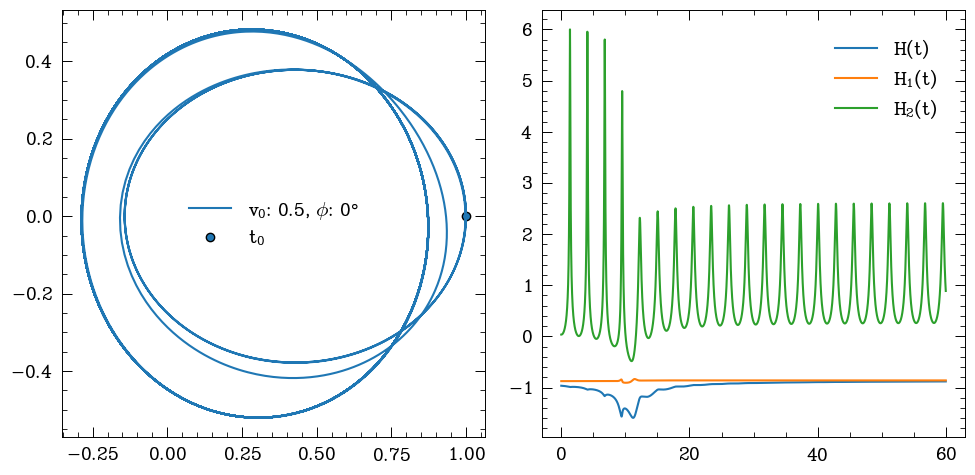

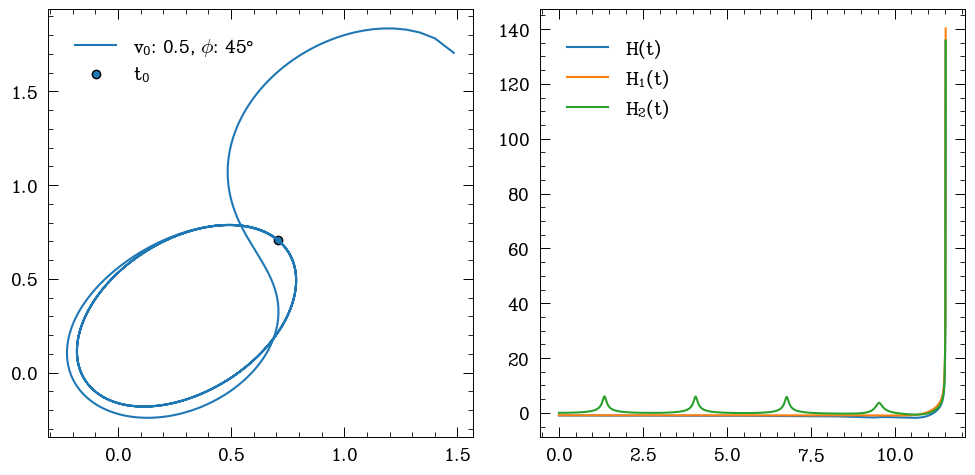

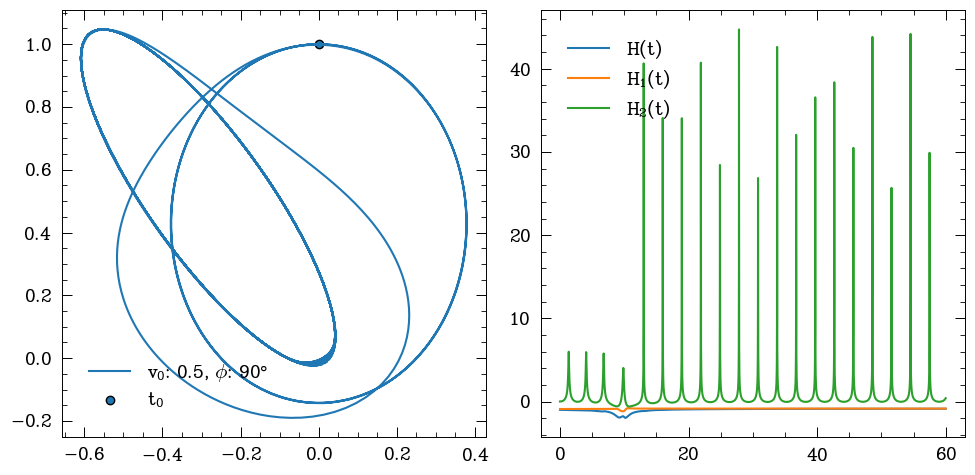

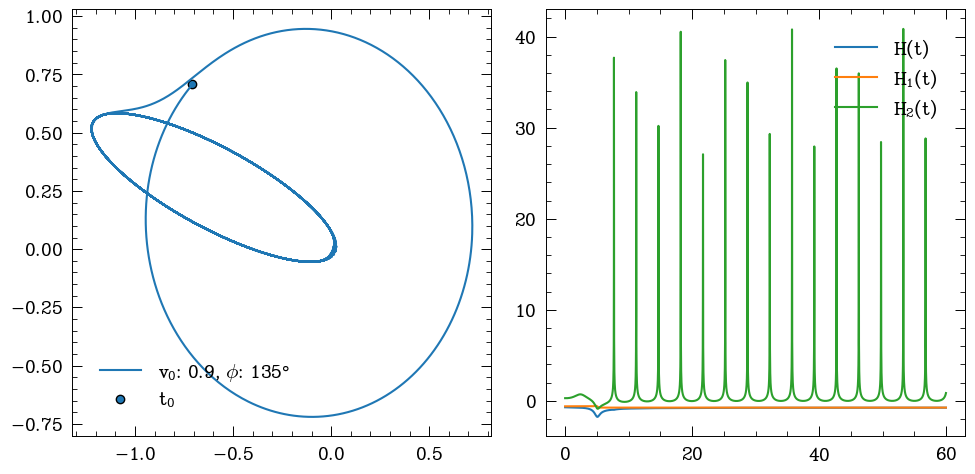

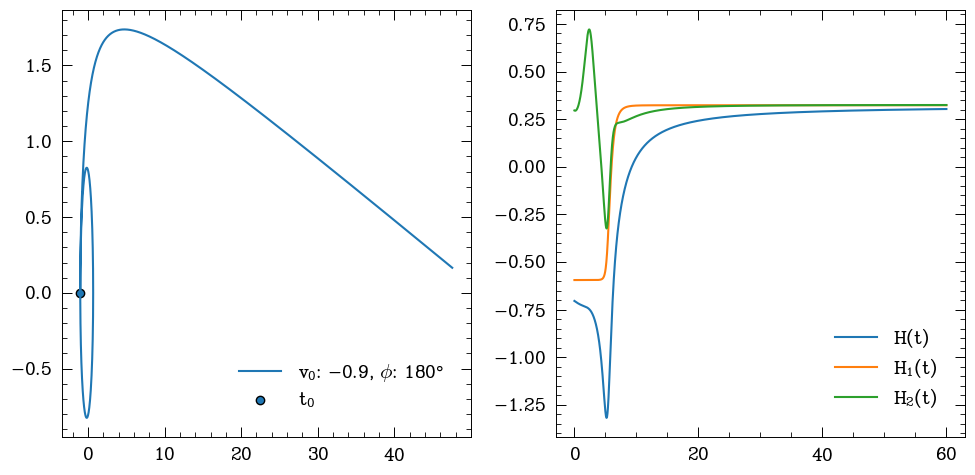

In [5]:
to_keep = [0, 1, 2, 11, 60]
for i, sol in enumerate(sols):
    if not i in to_keep:
        continue
    fig, [ax1, ax2] = plt.subplots(ncols=2, nrows=1, figsize=(10, 5))
    # ax1.set_title(f"i: {i}")
    ax1.plot(sol.y[0, :], sol.y[1, :], label = f"$v_0$: {sol.v0:0.1f}, $\phi$: {sol.phi * 180 / (np.pi):0.0f}°")
    ax1.scatter(sol.y[0, 0], sol.y[1, 0], label="$t_0$")
    ax1.legend()    

    ax2.plot(sol.t, sol.H, label="$H(t)$")
    ax2.plot(sol.t, sol.H1, label="$H_1(t)$")
    ax2.plot(sol.t, sol.H2, label="$H_2(t)$")
    ax2.legend()
    fig.tight_layout()
    fig.savefig(f"images/3-1-{i}.pdf")
    plt.show()

100%|██████████| 18/18 [15:57<00:00, 53.21s/it]


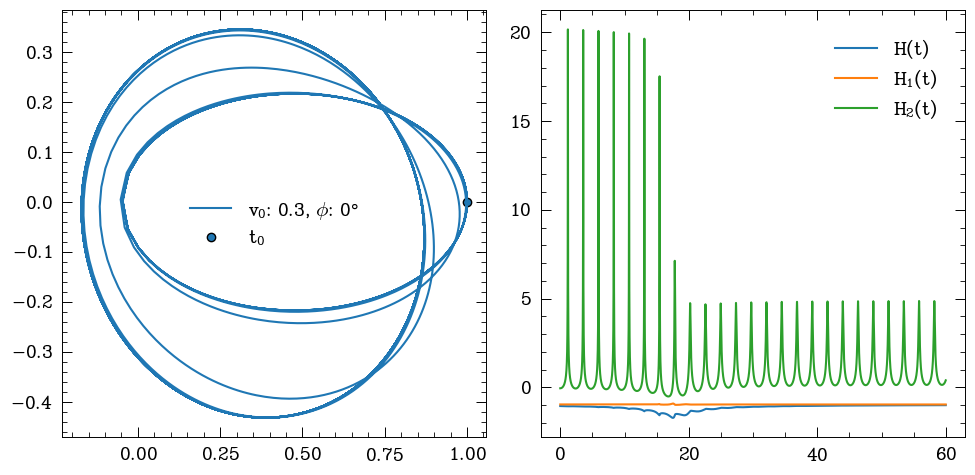

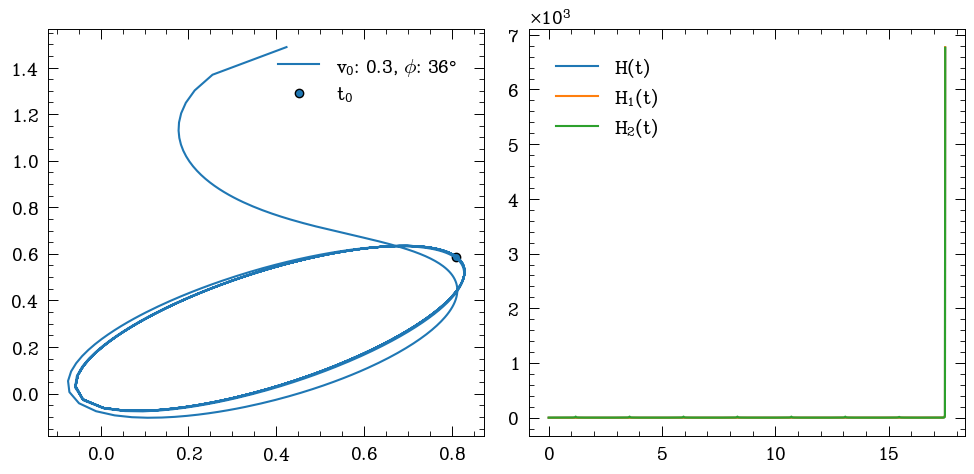

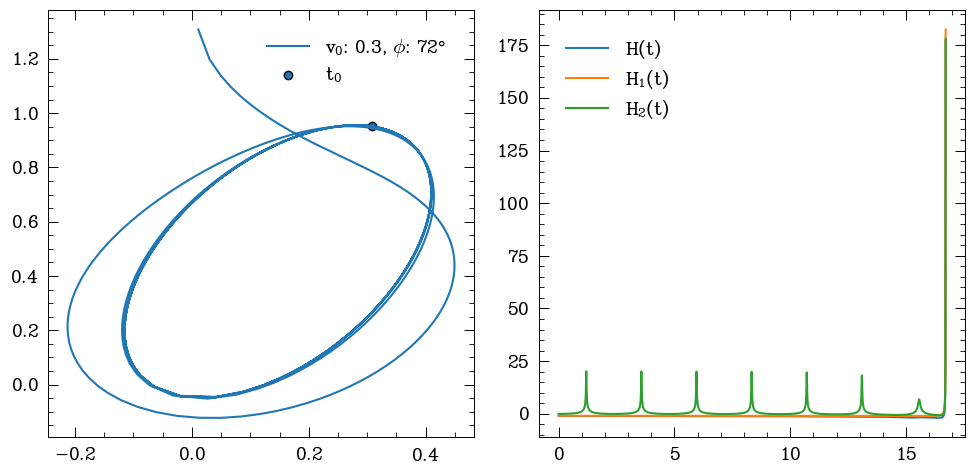

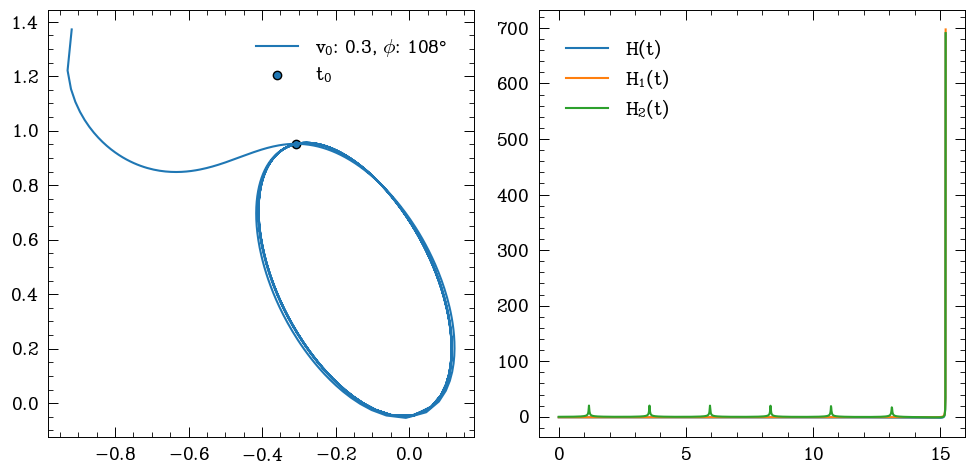

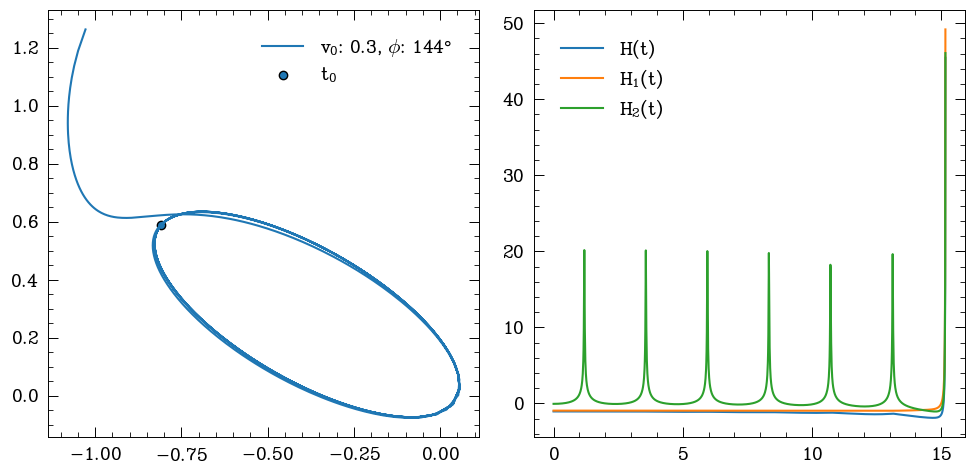

...

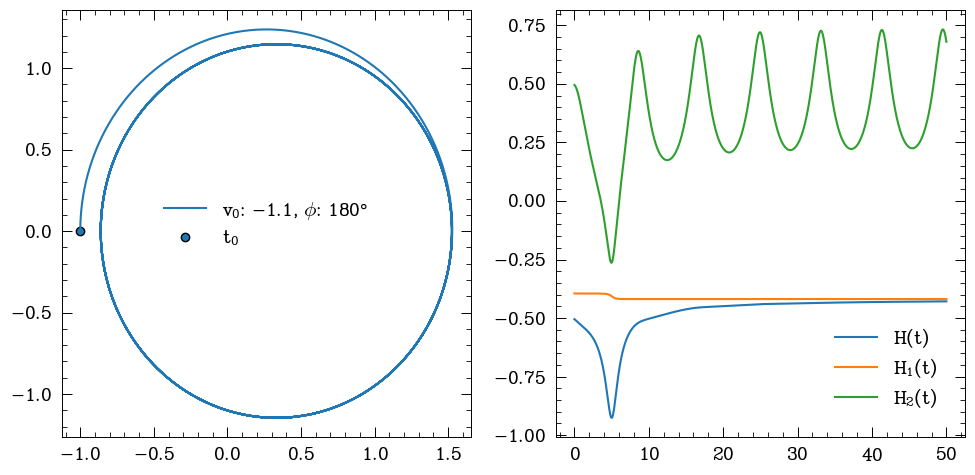

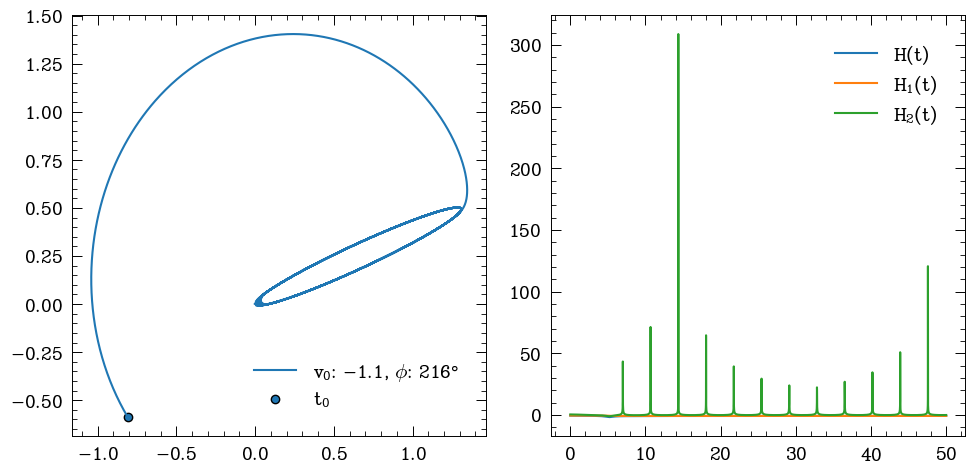

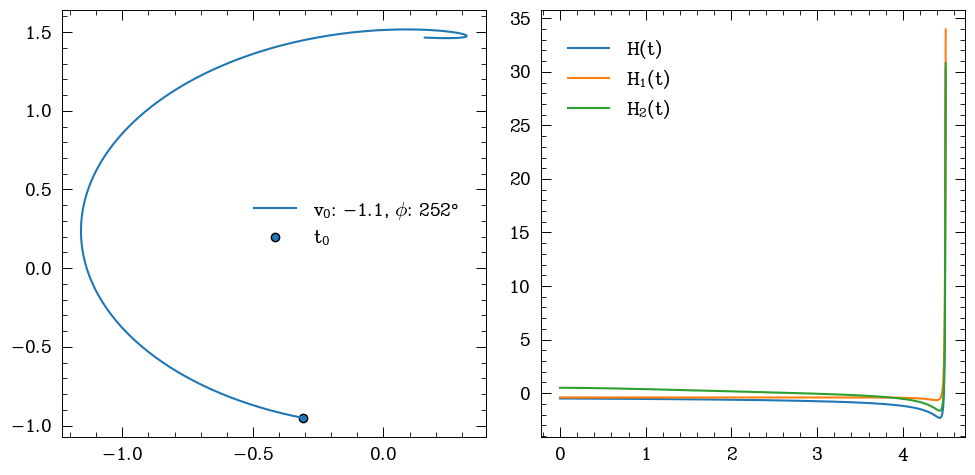

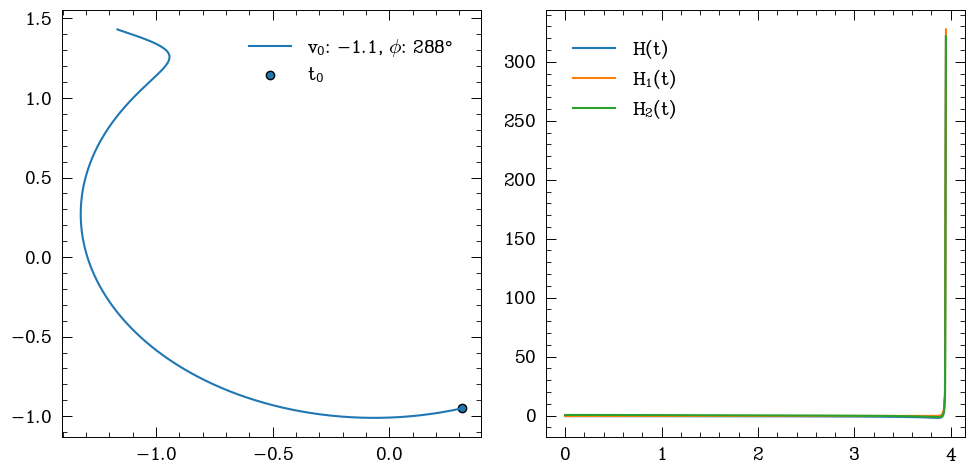

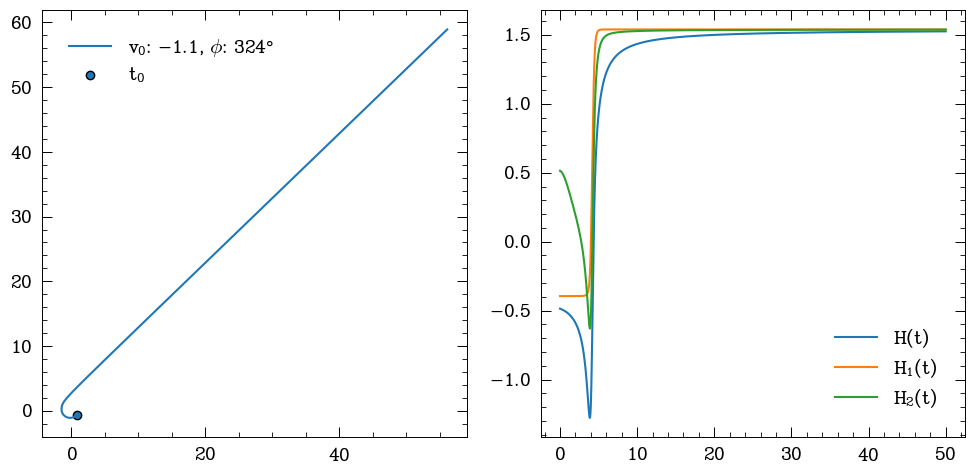

In [6]:
sols = []
from tqdm import tqdm

v0s = [
0.3,
0.4,
0.5,
0.6,
0.7,
0.8,
0.9,
1,
1.1
]
for v0 in tqdm(v0s + [-v0 for v0 in v0s]):
    for phi in np.linspace(0, 2 * np.pi, 10, endpoint=False):

        def odes(t, arej):
            x, y, u, v, x2 = arej
            x1, y1 = 0, 0
            # x2, y2 = -10 + 2 * v0 * t, 1.5
            y2 = 1.5
            d1 = (x - x1) ** 2 + (y - y1) ** 2
            d2 = (x - x2) ** 2 + (y - y2) ** 2
            xpika = u
            ypika = v
            upika = -(x - x1) * np.power(d1, -3 / 2) - (x - x2) * np.power(
                d2**2, -3 / 2
            )
            vpika = -(y - y1) * np.power(d1, -3 / 2) - (y - y2) * np.power(
                d2**2, -3 / 2
            )
            x2pika = np.abs(2 * v0)
            return [xpika, ypika, upika, vpika, x2pika]

        initial = [np.cos(phi), np.sin(phi), -np.sin(phi) * v0, v0 * np.cos(phi), -10]
        t_span = np.arange(0, 60, 0.01)

        def is_over(t, y):
            return y[4] - 100

        is_over.terminal = True
        is_over.direction = 1
        sol = solve_ivp(
            odes,
            t_span=[t_span.min(), t_span.max()],
            t_eval=t_span,
            events=is_over,
            y0=initial,
            dense_output=True,
            rtol=1e-20,
            atol=1e-20,
        )
        sol.phi = phi
        sol.v0 = v0

        def get_H(sol):
            x, y, u, v, x2 = sol.y
            T = (u**2 + v**2) * 0.5
            d1 = ((x - 0) ** 2 + (y - 0) ** 2) ** (0.5)
            d2 = ((x - x2) ** 2 + (y - 1.5) ** 2) ** (0.5)
            V = -1 / d1 - 1 / d2
            return T + V

        def get_H1(sol):
            x, y, u, v, x2 = sol.y
            T = (u**2 + v**2) * 0.5
            d1 = ((x - 0) ** 2 + (y - 0) ** 2) ** (0.5)
            d2 = ((x - x2) ** 2 + (y - 1.5) ** 2) ** (0.5)
            V = -1 / d1
            return T + V

        def get_H2(sol):
            x, y, u, v, x2 = sol.y
            T = (u**2 + v**2) * 0.5
            d1 = ((x - 0) ** 2 + (y - 0) ** 2) ** (0.5)
            d2 = ((x - x2) ** 2 + (y - 1.5) ** 2) ** (0.5)
            V = -1 / d2
            return T + V

        sol.H = get_H(sol)
        sol.H1 = get_H1(sol)
        sol.H2 = get_H2(sol)
        sols.append(sol)
        
# to_keep = [0, 1, 2, 11, 60]
for i, sol in enumerate(sols):
    # if not i in to_keep:
    #     continue
    fig, [ax1, ax2] = plt.subplots(ncols=2, nrows=1, figsize=(10, 5))
    # ax1.set_title(f"i: {i}")
    ax1.plot(sol.y[0, :], sol.y[1, :], label = f"$v_0$: {sol.v0:0.1f}, $\phi$: {sol.phi * 180 / (np.pi):0.0f}°")
    ax1.scatter(sol.y[0, 0], sol.y[1, 0], label="$t_0$")
    ax1.legend()    

    ax2.plot(sol.t, sol.H, label="$H(t)$")
    ax2.plot(sol.t, sol.H1, label="$H_1(t)$")
    ax2.plot(sol.t, sol.H2, label="$H_2(t)$")
    ax2.legend()
    fig.tight_layout()
    # fig.savefig(f"images/3-1-{i}.pdf")
    plt.show()